#Imports py

In [0]:

!pip3 install line_profiler
!pip3 install torch-lr-finder 
!pip install essential_generators

%load_ext line_profiler

In [0]:
import imports

#Project

# Memes classification project
<div>This project is an classification of memes  scraped from 
<a href="https://www.reddit.com/r/AdviceAnimals/">r/AdviceAnimals</a>
reddit thread by different categories
</div>
<div>Project is made for Vilnius School of AI</div>
<div>Data: unlabled meme images</div>
<div>Goal: train a model that can classify background image of meme</div>

#Data

In [0]:
memese = pd.read_csv("fine_meme.csv",index_col=0)

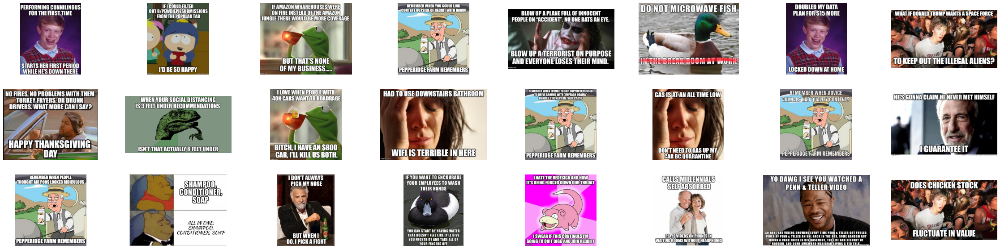

In [184]:
fig = plt_meme(memese,(3,8))

In [0]:
memese.iloc[:,:-2].head(5)

,all_awardings,author,author_premium,created_utc,num_comments,over_18,permalink,secure_media,title,total_awards_received,ups,url,DateTime,fname,type,prob
t3_a4hoej,[],Irena089,False,1.549533e+09,0.0,False,/r/AdviceAnimals/comments/a4hoej/ducks/,NaN,Ducks,0.0,0.0,https://i.redd.it/twldtv3o96321.jpg,2019-02-07 09:42:43,twldtv3o96321.jpg,0,0.999883
t3_anqllp,[],stoicjohn,False,1.549541e+09,48.0,False,/r/AdviceAnimals/comments/anqllp/those_awnings...,NaN,Those awnings do nothing.,0.0,919.0,https://i.redd.it/o8hvdmpn7ye21.jpg,2019-02-07 11:57:03,o8hvdmpn7ye21.jpg,8,0.998291
t3_anr8aq,[],dfGobBluth,False,1.549549e+09,163.0,False,/r/AdviceAnimals/comments/anr8aq/it_may_seem_o...,NaN,"It may seem obvious, but if this reminder help...",0.0,6038.0,https://i.redd.it/8365uagqkye21.jpg,2019-02-07 14:08:53,8365uagqkye21.jpg,8,0.998846
t3_ao2hj5,[],browserleet,False,1.549549e+09,1.0,False,/r/AdviceAnimals/comments/ao2hj5/21_savage_and...,NaN,21 Savage and ICE,0.0,30.0,https://i.redd.it/301vl5srk4f21.jpg,2019-02-07 14:11:42,301vl5srk4f21.jpg,0,0.946487
t3_ao067z,[],PM_ME_YOUR_FAV_HIKE,False,1.549549e+09,9.0,False,/r/AdviceAnimals/comments/ao067z/i_love_the_sm...,NaN,I love the smell of Napalm in the morning...,0.0,50.0,https://i.redd.it/6og05v8lv2f21.jpg,2019-02-07 14:13:36,6og05v8lv2f21.jpg,3,0.998411


In [0]:
print("Number of memes: "+str(memese.shape[0]))

Number of memes: 12576


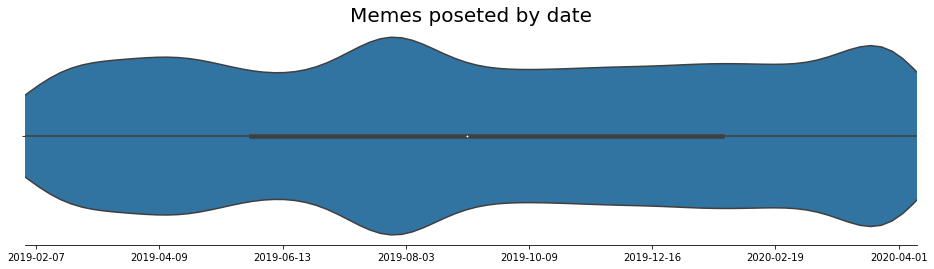

In [0]:
memes_by_date(memese)

**Top 5 mos popular memes:**

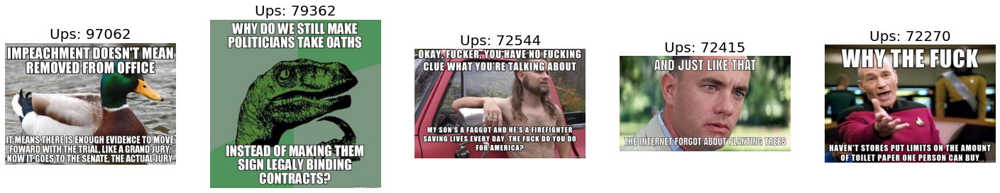

In [0]:
top_memes(5,memese)

#Training Process

Training process for this model is iterative. There is possiblity to add approximately 10 new images on each iteration.

**I use ResNet34:**

In [113]:
model = torch.hub.load('pytorch/vision:v0.6.0', 'resnet34', pretrained=True)
outputs = 20
cmod = nn.Sequential(
    nn.Sequential(*list(model.children())[:-2]),
    AdaptiveConcatPool2d(1),
    Flatten(),
    nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    nn.Dropout(p=0.25, inplace=False),
    nn.Linear(in_features=1024, out_features=512, bias=True),
    nn.ReLU(inplace=True),
    nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(in_features=512, out_features=outputs, bias=True)
               )
cmod.cuda()
pass

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.6.0


Clusterize all images with original ResNet34:

In [0]:
nemmod = nn.Sequential(
    cmod[:2],
    Flatten()
)
nemmod.eval()
mndim = fezt_ext(memese,64,True)
pcaed = pd.DataFrame(mndim.iloc[:,:1],columns=["fname","comp1","comp2","cluster"])
pcaed = pca(mndim,pcaed)

Bunches: 0
Bunches: 10
Bunches: 20
Bunches: 30
Bunches: 40
Bunches: 50
Bunches: 60


In [0]:
pcaed=pcaed.loc[memese[memese["rtype"]==0].index]

At this image there are features extracted from pretrained before ResNet34 final Average Pooling layer compresed with PCA and clustered with DBSCAN.

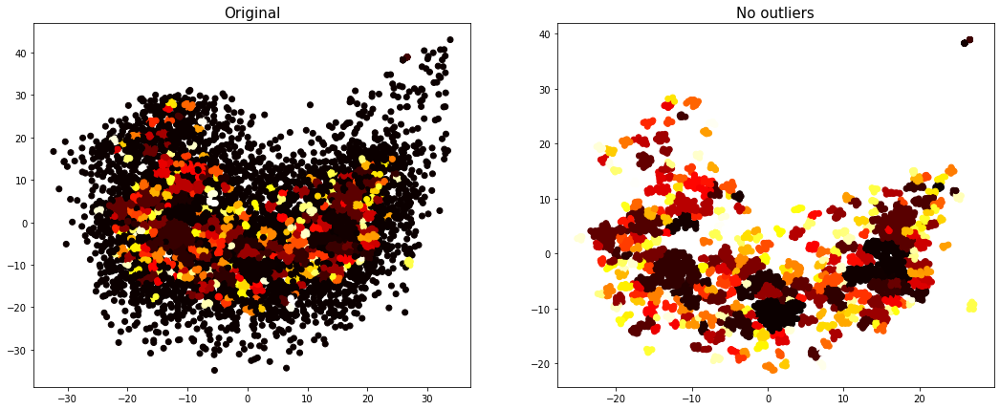

In [0]:
clusters = plot_cats(pcaed,0.5,5,(18,7),0)

Next there is subsamples of largest clusters

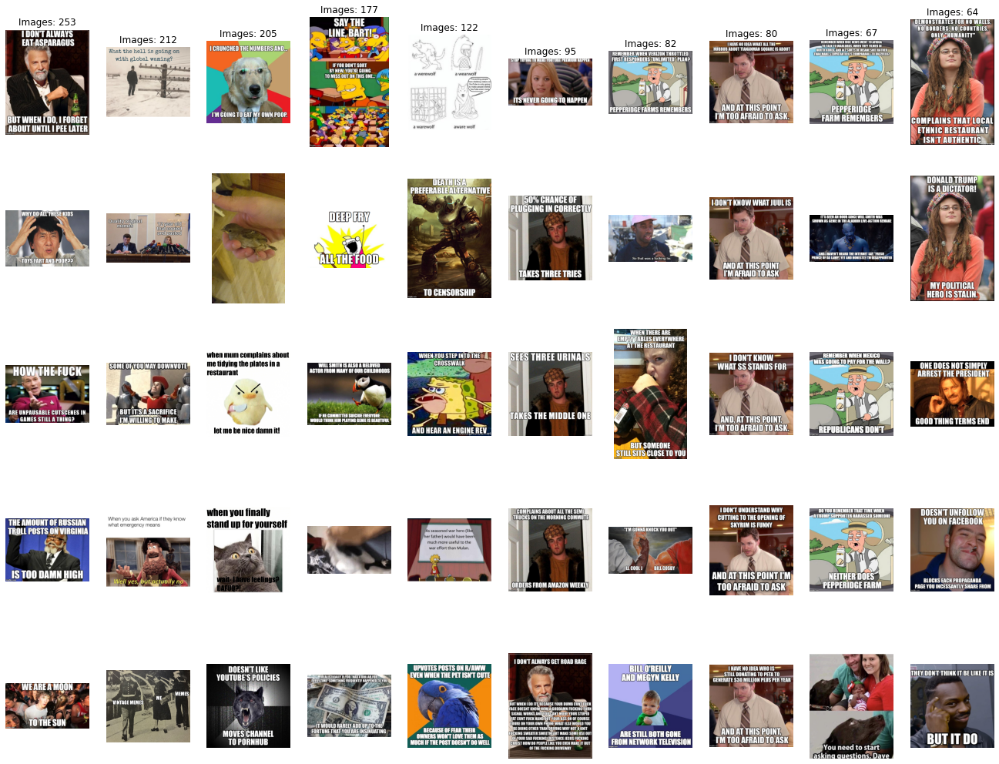

In [0]:
plot_top_clusters(10,5,(23,18),clusters)

First step is to upload chekpoint:

In [114]:
checkpoint = torch.load("NewChekpoints/20teset.pth")
cmod.load_state_dict(checkpoint)

<All keys matched successfully>

Then number of outputs for new images should be added:

In [0]:
addoutput(cmod,12)
cmod[-1]

Linear(in_features=512, out_features=42, bias=True)

**Next step is to create generators**

ImgAug transfomers for generators:

In [0]:
seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Crop(percent=(0, 0.3)),
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    iaa.LinearContrast((0.75, 1.5)),
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-90, 90),
        shear=(-8, 8),
        mode='reflect'
    )
], random_order=True) 

seq_cats = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Crop(percent=(0, 0.03)),
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    
    iaa.LinearContrast((0.75, 1.5)),
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        #rotate=(-10, 10),
        mode='reflect'
    )
], random_order=True)

Fonts for text no generated memes:

In [0]:
fontpath = "data/fonts/"
fonts = [fontpath+"impact.ttf",fontpath+"Montserrat.ttf",fontpath+"ComicSans.ttf",fontpath+"Arial.ttf"]

Generators for an already existing categories:

In [0]:
gens1 = ImageGenerator("Bckup/Batch1/",seq_cats,fonts,(10,1),4e-6,(0.08,0.15),True,True,1)
gens2 = ImageGenerator("Bckup/Batch2/",seq_cats,fonts,(10,1),4e-6,(0.08,0.15),True,True,10)
gens3 = ImageGenerator("Bckup/Batch3/",seq_cats,fonts,(10,1),4e-6,(0.08,0.15),True,True,20)

Generator for butch of new images:

In [0]:
gens4 = ImageGenerator("Bckup/Batch4/",seq_cats,fonts,(10,1),4e-6,(0.08,0.15),True,True,30)

Special generator fot 0 category that represents everething that is not trained yet:

In [0]:
noth_type = ImageGenerator("MemeTypes/imagenetfil/",seq,fonts,(10,1),4e-6,(0.08,0.15))

Then prcentage of images from different generators should be defined
<div></div>
In this example:
<div></div>
0 cat - 10%
<div></div>
already known images - 40%
<div></div>
new images - 50%

In [0]:
gent = [(0.1,noth_type),(0.4/3,gens1),(0.4/3,gens2),(0.4/3,gens3),(0.5,gens4)]

In [0]:
gent = [(0.1,noth_type),(0.2,gens1),(0.2,gens2),(0.5,gens3)]

Now I create pytorch dataset from this generators

In [0]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

In [0]:
normalizer = transforms.Compose([
    
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean,
                         std=std)
])
datagen = Dataset_ram(gent,6400,normalizer)
datagen.pregen(10)
datagen.loop_pregen()

In [0]:
loader = data.DataLoader(dataset = datagen,batch_size=64,pin_memory=True)

**Generator example**

Generators applys ImgAug transformer on clear background image and then writes multiple words on top.

In [0]:
itt = iter(datagen)

Class: 29


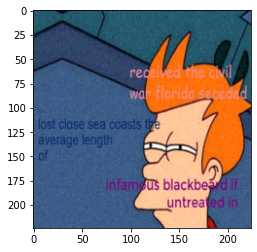

In [0]:
gened = next(itt)
plt.imshow(denormalize(gened[0],mean,std).permute(1,2,0))
print("Class: "+str(gened[1]))

**Train model**

First step is to pregenerate images and store them in ram to use same data in hyperparemeters search and training to save time.

In [0]:
datagen.unplug_pregen()
datagen.pregen(3200)
datagen.loop_pregen()
datagen.samples = 6400000
dataiter = iter(datagen)

Generated: 0
Generated: 500
Generated: 1000
Generated: 1500
Generated: 2000
Generated: 2500
Generated: 3000


Then I freeze all original ResNet34 part of model

In [0]:
parameters = set_parameters(cmod)

In [0]:
freeze(cmod,[1,2])

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()


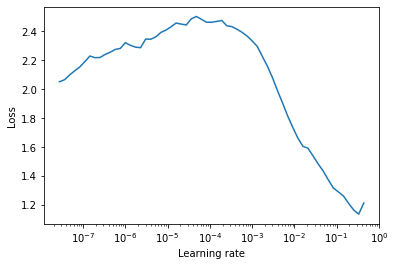

In [0]:
loader = data.DataLoader(dataset = datagen,batch_size=64,pin_memory=True)
parameters = set_parameters(cmod)
optimizer = optim.Adam(parameters, lr=0.000000001)
lr_find(cmod,parameters,loader,optimizer)

In [0]:
train_cat(cmod,parameters,3e-3,50,loader)

Loss: 2.646743059158325
Loss: 0.65336012840271
Loss: 0.0925673395395279
Loss: 0.032955363392829895
Loss: 0.12005506455898285
Loss: 0.06126636266708374
Loss: 0.021891437470912933
Loss: 0.1274612545967102
Loss: 0.022506512701511383
Loss: 0.17795853316783905


Now I genrate new data for next step of trainig whith whole ResNet34

In [0]:
datagen.unplug_pregen()
datagen.pregen(3200)
datagen.loop_pregen()
datagen.samples = 6400000
dataiter = iter(datagen)

Generated: 0
Generated: 500
Generated: 1000
Generated: 1500
Generated: 2000
Generated: 2500
Generated: 3000


In [0]:
loader = data.DataLoader(dataset = datagen,batch_size=64,pin_memory=True)

There ResNet is splited in 3 parts so now I should fid LR for each one.


In [0]:
parameters = set_parameters(cmod)
optimizer = optim.Adam(parameters, lr=0.00000000001)

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()


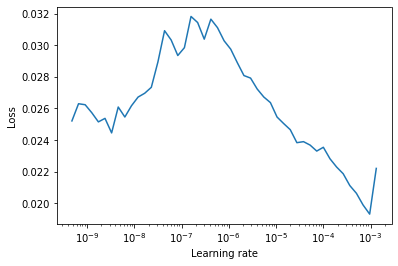

In [0]:
unfreeze(cmod)
lr_find(cmod,parameters,loader,optimizer)

In [0]:
train_cat(cmod,parameters,[5e-8,5e-5,1e-4],70,loader)

Loss: 0.007399618625640869
Loss: 0.03273037075996399
Loss: 0.00731503963470459
Loss: 0.043209295719861984
Loss: 0.00915335863828659
Loss: 0.00957605242729187
Loss: 0.010462410748004913
Loss: 0.009782277047634125
Loss: 0.007682517170906067
Loss: 0.018267028033733368
Loss: 0.0033080726861953735
Loss: 0.007053211331367493
Loss: 0.005714379251003265
Loss: 0.005595594644546509


Now it is possible to save model and use it on real data set

In [0]:
torch.save(cmod.state_dict(), "NewChekpoints/42test.pth")
memese = predict(cmod,memese,64)

Bunches: 0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:409: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


Bunches: 10
Bunches: 20
Bunches: 30
Bunches: 40
Bunches: 50
Bunches: 60


In [0]:
memese.to_csv("fine_meme.csv")

#Results exploration

Next plot show how images in each category are distributed by SoftMax percentage

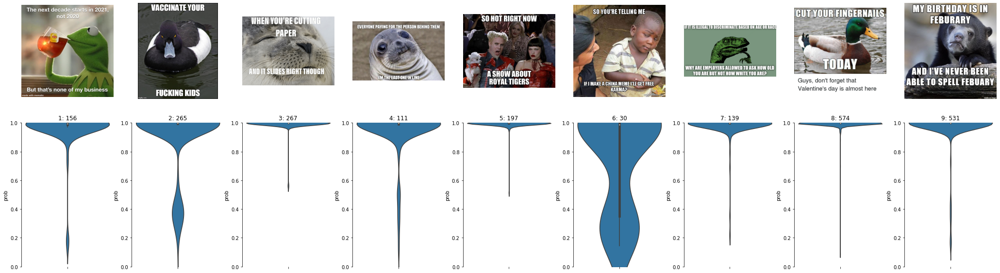

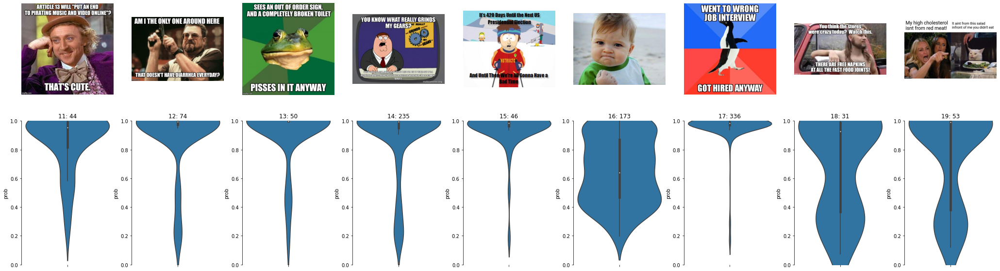

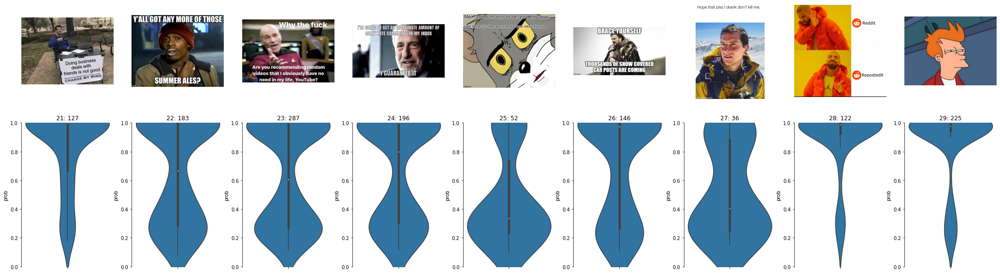

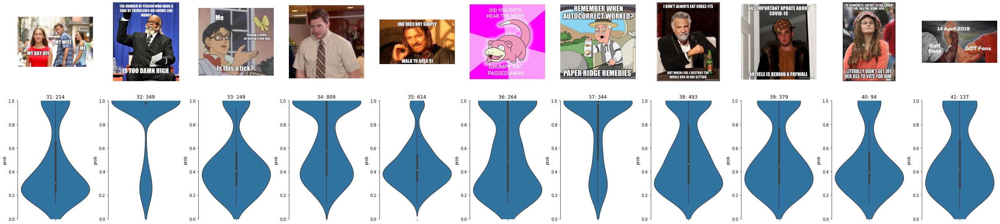

In [0]:
dists((1,10),4,memese)
dists((11,20),4,memese)
dists((21,30),4,memese)
dists((31,42),4,memese)

**Results**<div></div>
Ther is 3 main types of categories:
* Flower(1,3,7) - categroy is well known other images are assigned to other categories
* Bottle neck(6,18,19) - categroy is known but there is group of other images that is assigned to this category with less probability
* Barrel(16) - there is many other images that are similar to this catategory so there is practically imposible to define a treshold

This function shows nearest images in category to treshold:

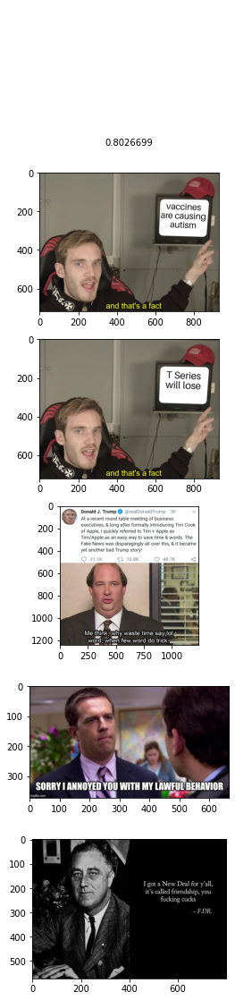

In [0]:
plots_cat(38,5,4,memese,0.8)

Base treshold for all classes is 80%

In [0]:
probs = [0.80]*42
probs[35]=0.85
probs[36]=0.9
probs[38]=0.85
probs[39]=0.85

In [0]:
memese["rtype"] = memese.apply(lambda x:real_val(x,probs),axis=1)

Final df with classes that fit in treshold:

In [0]:
memese[memese["rtype"]!=0]

,all_awardings,author,author_premium,created_utc,num_comments,over_18,permalink,secure_media,title,total_awards_received,ups,url,DateTime,fname,type,prob,secs,rtype
t3_anqllp,[],stoicjohn,False,1.549541e+09,48.0,False,/r/AdviceAnimals/comments/anqllp/those_awnings...,NaN,Those awnings do nothing.,0.0,919.0,https://i.redd.it/o8hvdmpn7ye21.jpg,2019-02-07 11:57:03,o8hvdmpn7ye21.jpg,8,0.998291,1549540623000000000,8
t3_anr8aq,[],dfGobBluth,False,1.549549e+09,163.0,False,/r/AdviceAnimals/comments/anr8aq/it_may_seem_o...,NaN,"It may seem obvious, but if this reminder help...",0.0,6038.0,https://i.redd.it/8365uagqkye21.jpg,2019-02-07 14:08:53,8365uagqkye21.jpg,8,0.998846,1549548533000000000,8
t3_ao067z,[],PM_ME_YOUR_FAV_HIKE,False,1.549549e+09,9.0,False,/r/AdviceAnimals/comments/ao067z/i_love_the_sm...,NaN,I love the smell of Napalm in the morning...,0.0,50.0,https://i.redd.it/6og05v8lv2f21.jpg,2019-02-07 14:13:36,6og05v8lv2f21.jpg,3,0.998411,1549548816000000000,3
t3_anm5jm,[],lp_me,False,1.549550e+09,12.0,False,/r/AdviceAnimals/comments/anm5jm/im_not_quite_...,NaN,I’m not quite sure what everyone is worked up ...,0.0,38.0,https://i.redd.it/cda4kgq05ve21.jpg,2019-02-07 14:32:42,cda4kgq05ve21.jpg,34,0.986697,1549549962000000000,34
t3_anh846,[],Bulevine,False,1.549551e+09,4.0,False,/r/AdviceAnimals/comments/anh846/how_video_gam...,NaN,How video game publishers must view the gaming...,0.0,28.0,https://i.imgur.com/T4CZ7Nj.jpg,2019-02-07 14:46:02,T4CZ7Nj.jpg,22,0.998233,1549550762000000000,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
t3_fse63n,[],duffman83x,False,1.585755e+09,13.0,False,/r/AdviceAnimals/comments/fse63n/shes_due_apri...,NaN,She's Due April 17th,0.0,166.0,https://i.redd.it/dw8dllkat0q41.png,2020-04-01 15:30:22,dw8dllkat0q41.png,20,0.999382,1585755022000000000,20
t3_fsuesd,[],RelativeMasterpiece0,False,1.585759e+09,4.0,False,/r/AdviceAnimals/comments/fsuesd/frugal_depres...,NaN,Frugal Depression,0.0,30.0,https://i.redd.it/0jg53gwyi5q41.png,2020-04-01 16:34:58,0jg53gwyi5q41.png,9,0.999497,1585758898000000000,9
t3_fsqlrv,[],Feellikedancing,False,1.585760e+09,4.0,False,/r/AdviceAnimals/comments/fsqlrv/getting_real_...,NaN,Getting real sick of quarantine,0.0,36.0,https://i.redd.it/d9ydsgp484q41.jpg,2020-04-01 16:46:45,d9ydsgp484q41.jpg,20,0.998039,1585759605000000000,20
t3_fsqlqq,[],dee_ba_doe,False,1.585762e+09,8.0,False,/r/AdviceAnimals/comments/fsqlqq/well_bail_you...,NaN,We’ll bail you out if you STFU!,0.0,74.0,https://i.redd.it/o07mvqc484q41.jpg,2020-04-01 17:34:35,o07mvqc484q41.jpg,14,0.998528,1585762475000000000,14


#Data Science

**Most popular memes**

In [0]:
popular_memes = memese.groupby(by=["rtype"]).count()["prob"].sort_values(ascending=False)[1:10]
best_by_cat = memese.sort_values(by=["prob"],ascending=False).groupby(by=["rtype"]).first()["fname"]

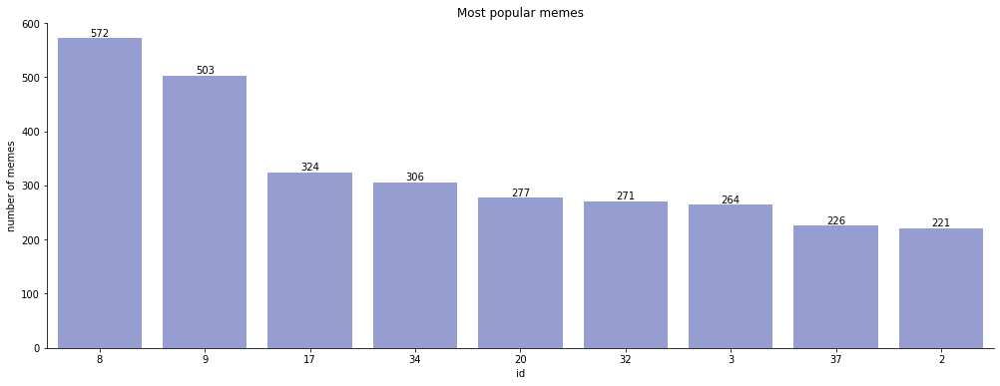

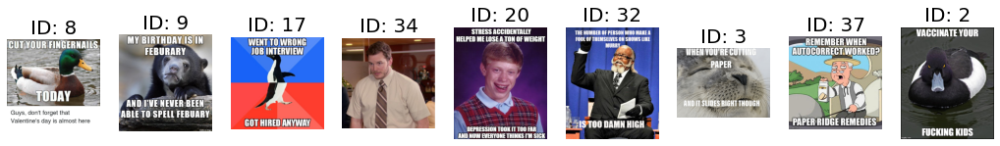

In [0]:
bar_ch(popular_memes,"Most popular memes","id","number of memes",(17,6))
plt_meme(popular_memes,(18,4),best_by_cat)

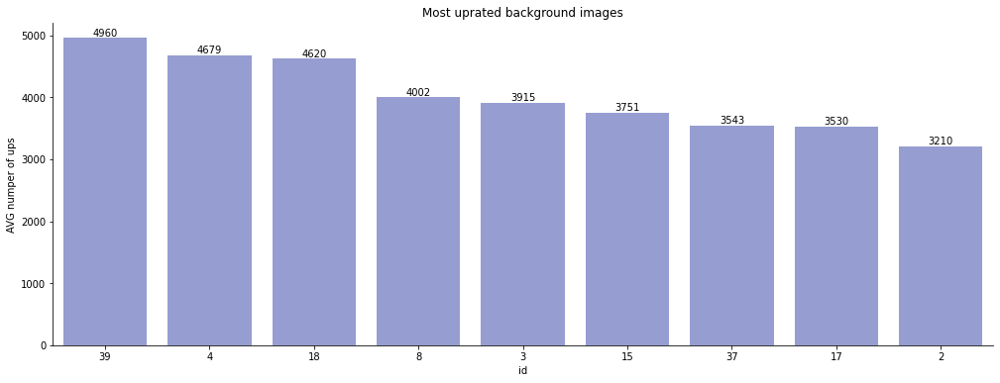

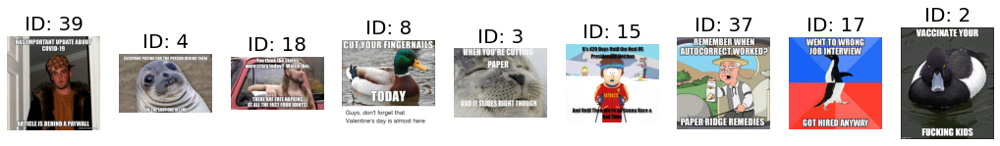

In [0]:
ups_memes = memese.groupby(by=["rtype"])["ups"].mean().sort_values(ascending=False)[1:10].astype("int")
bar_ch(ups_memes,"Most uprated background images","id","AVG numper of ups",(17,6))
plt_meme(ups_memes,(18,4),best_by_cat)

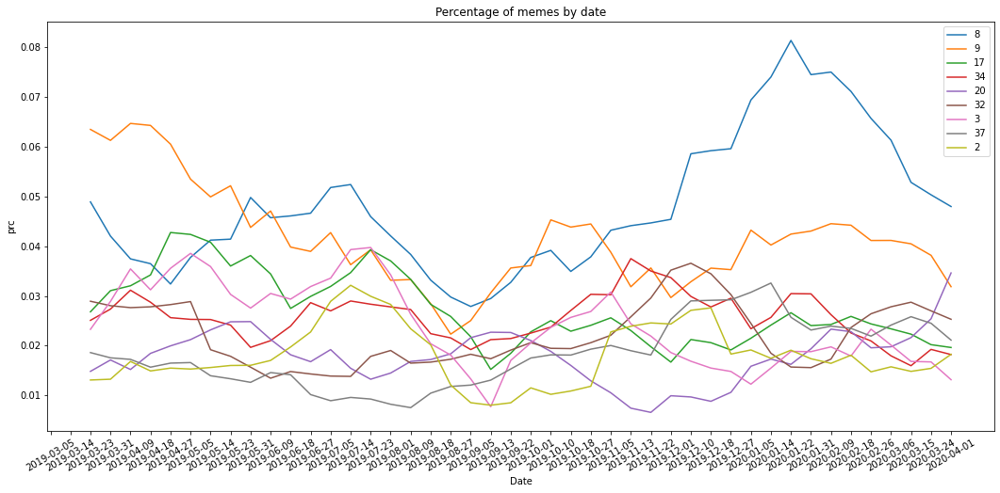

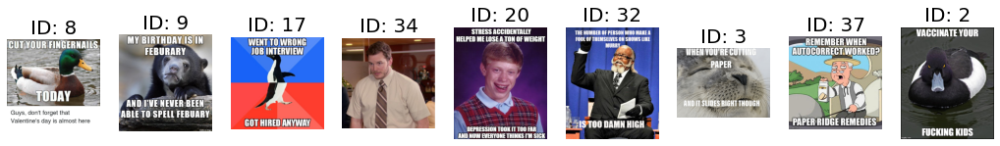

In [0]:
memese.sort_values(by=["DateTime"],inplace=True)
memes_prc(memese,50,6,popular_memes)
plt_meme(popular_memes,(18,4),best_by_cat)

**Heat maps of most popular memes**

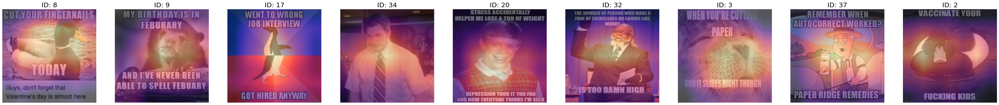

In [117]:
mask_mod = cmod[0]
plt_heat_meme(popular_memes,(54,12),best_by_cat,mask_mod, 'bilinear')

#Predict class of your meme

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:696: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


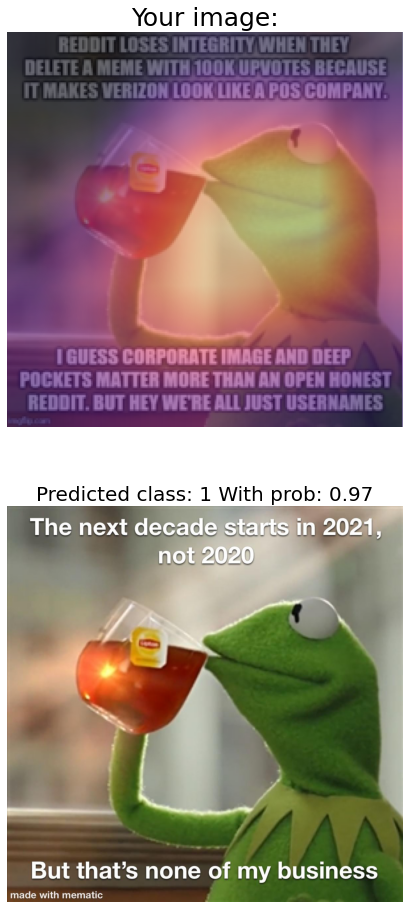

In [190]:
cmod.eval()
cust_pred(cmod,"lipton.jpg",best_by_cat,'bilinear')